In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# Importing Libraries

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.exceptions import ConvergenceWarning
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.decomposition import PCA
from sklearn.feature_selection import VarianceThreshold
from sklearn.datasets import make_regression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from tensorflow import keras
import pickle
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from tensorflow.keras.layers import Dense, SimpleRNN, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, GRU, Dropout
from sklearn.svm import SVC
import lime
from lime import lime_tabular
from sklearn.feature_selection import SelectKBest, f_classif
import plotly.express as px
from mlxtend.plotting import plot_decision_regions
from sklearn.metrics import r2_score
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold, ShuffleSplit, LeavePOut

In [4]:
warnings.filterwarnings("ignore", category=ConvergenceWarning) # this line help to remove warnings

In [ ]:
# Load the datasets

X = pd.read_csv("/content/gdrive/MyDrive/dataset/data.csv")
y = pd.read_csv("/content/gdrive/MyDrive/dataset/labels.csv")

# Preprocessing of Data

In [ ]:
# Dropping Last Column because it contains string values of no use

X = X.drop("Unnamed: 0", axis=1)
y = y.drop("Unnamed: 0", axis=1)

### Cleaning of Data

In [ ]:
print(X.isnull().sum().sum())  # Checking for null values

0


<p> We have checked for null values and we found that there were no Null Values in the data Set Which shows there is no need for data imputation  </p>

### Outlier Analysis

In [ ]:
# Calculatinf Z scores and removing outliers

z_scores = (X - X.mean()) / X.std()
outliers = (z_scores.abs() > 25)
X = X[~outliers.any(axis=1)]
y = y[~outliers.any(axis=1)]
X

,gene_0,gene_1,gene_2,gene_3,gene_4,gene_5,gene_6,gene_7,gene_8,gene_9,...,gene_20521,gene_20522,gene_20523,gene_20524,gene_20525,gene_20526,gene_20527,gene_20528,gene_20529,gene_20530
1,0.000000,0.592732,1.588421,7.586157,9.623011,0.0,6.816049,0.000000,0.0,0.0,...,4.593372,7.323865,9.740931,6.256586,8.381612,12.674552,10.517059,9.397854,2.094168,0.0
2,0.000000,3.511759,4.327199,6.881787,9.870730,0.0,6.972130,0.452595,0.0,0.0,...,5.125213,8.127123,10.908640,5.401607,9.911597,9.045255,9.788359,10.090470,1.683023,0.0
3,0.000000,3.663618,4.507649,6.659068,10.196184,0.0,7.843375,0.434882,0.0,0.0,...,6.076566,8.792959,10.141520,8.942805,9.601208,11.392682,9.694814,9.684365,3.292001,0.0
4,0.000000,2.655741,2.821547,6.539454,9.738265,0.0,6.566967,0.360982,0.0,0.0,...,5.996032,8.891425,10.373790,7.181162,9.846910,11.922439,9.217749,9.461191,5.110372,0.0
5,0.000000,3.467853,3.581918,6.620243,9.706829,0.0,7.758510,0.000000,0.0,0.0,...,5.726657,8.602588,9.928339,6.096154,9.816001,11.556995,9.244150,9.836473,5.355133,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,0.436588,4.472176,4.908746,5.937848,9.330901,0.0,7.254944,0.429107,0.0,0.0,...,6.024397,8.965421,10.707558,5.435152,10.475561,10.961247,10.203226,10.030005,3.675703,0.0
796,0.000000,1.865642,2.718197,7.350099,10.006003,0.0,6.764792,0.496922,0.0,0.0,...,6.088133,9.118313,10.004852,4.484415,9.614701,12.031267,9.813063,10.092770,8.819269,0.0
797,0.000000,3.942955,4.453807,6.346597,10.056868,0.0,7.320331,0.000000,0.0,0.0,...,6.371876,9.623335,9.823921,6.555327,9.064002,11.633422,10.317266,8.745983,9.659081,0.0
799,0.000000,2.590339,2.787976,7.318624,9.987136,0.0,9.213464,0.000000,0.0,0.0,...,5.785237,8.605387,11.004677,4.745888,9.626383,11.198279,10.335513,10.400581,5.718751,0.0


<p> So we found the z-score and then on basis of that criteria we removed some outlier points from our data set<p>

## Data Transformation

### Standarize the dataset

In [ ]:
# Standardizing the data
scaler = StandardScaler()
X_standardized = pd.DataFrame(scaler.fit_transform(X))

In [ ]:
X_standardized

,0,1,2,3,4,5,6,7,8,9,...,20521,20522,20523,20524,20525,20526,20527,20528,20529,20530
0,-0.198893,-2.018821,-1.414716,1.374331,-0.354741,0.0,-0.529076,-0.984559,-0.121199,-0.068066,...,-1.756797,-2.416704,-0.852736,0.608405,-2.593754,1.391312,0.630983,-0.343736,-1.676494,-0.285455
1,-0.198893,0.421920,1.176583,0.246118,0.135399,0.0,-0.387390,-0.087433,-0.121199,-0.068066,...,-1.043105,-1.068942,2.307560,0.249074,0.322318,-4.081372,-0.631999,0.919246,-1.876472,-0.285455
2,-0.198893,0.548897,1.347316,-0.110619,0.779347,0.0,0.403502,-0.122545,-0.121199,-0.068066,...,0.233541,0.048248,0.231420,1.737372,-0.269268,-0.541643,-0.794132,0.178715,-1.093876,-0.285455
3,-0.198893,-0.293838,-0.247992,-0.302210,-0.126698,0.0,-0.755186,-0.269027,-0.121199,-0.068066,...,0.125470,0.213461,0.860036,0.996987,0.199027,0.257188,-1.620980,-0.228242,-0.209432,-0.285455
4,-0.198893,0.385209,0.471434,-0.172806,-0.188897,0.0,0.326464,-0.984559,-0.121199,-0.068066,...,-0.236011,-0.271172,-0.345533,0.540979,0.140117,-0.293874,-1.575222,0.456084,-0.090382,-0.285455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
740,2.911910,1.224972,1.726814,-1.265822,-0.932713,0.0,-0.130660,-0.133991,-0.121199,-0.068066,...,0.163535,0.337615,1.763348,0.263172,1.397204,-1.192212,0.087047,0.808988,-0.907246,-0.285455
741,-0.198893,-0.954479,-0.345776,0.996230,0.403053,0.0,-0.575606,0.000431,-0.121199,-0.068066,...,0.249064,0.594149,-0.138457,-0.136404,-0.243552,0.421291,-0.589183,0.923441,1.594552,-0.285455
742,-0.198893,0.782465,1.296373,-0.611115,0.503694,0.0,-0.071302,-0.984559,-0.121199,-0.068066,...,0.629826,1.441511,-0.628130,0.733961,-1.293155,-0.178627,0.284701,-1.532420,2.003031,-0.285455
743,-0.198893,-0.348524,-0.279755,0.945815,0.365722,0.0,1.647233,-0.984559,-0.121199,-0.068066,...,-0.157401,-0.266475,2.567474,-0.026512,-0.221287,-0.834787,0.316327,1.484732,0.086480,-0.285455


### Normalize the dataset

In [ ]:
normalizer = MinMaxScaler()  # Normalizing the data
X_normalized = pd.DataFrame(normalizer.fit_transform(X))

In [ ]:
X_normalized

,0,1,2,3,4,5,6,7,8,9,...,20521,20522,20523,20524,20525,20526,20527,20528,20529,20530
0,0.000000,0.095034,0.261965,0.618830,0.406563,0.0,0.425094,0.000000,0.0,0.0,...,0.353806,0.145807,0.404515,0.684569,0.070561,0.777134,0.720519,0.309838,0.141369,0.0
1,0.000000,0.563050,0.713649,0.449677,0.491410,0.0,0.448090,0.162862,0.0,0.0,...,0.461958,0.327250,0.845362,0.591020,0.485144,0.000000,0.544738,0.449794,0.102625,0.0
2,0.000000,0.587397,0.743409,0.396192,0.602881,0.0,0.576451,0.156488,0.0,0.0,...,0.655419,0.477651,0.555750,0.978483,0.401037,0.502650,0.522173,0.367733,0.254246,0.0
3,0.000000,0.425802,0.465334,0.367467,0.446039,0.0,0.388397,0.129896,0.0,0.0,...,0.639042,0.499893,0.643439,0.785732,0.467616,0.616085,0.407093,0.322636,0.425599,0.0
4,0.000000,0.556010,0.590736,0.386868,0.435272,0.0,0.563948,0.000000,0.0,0.0,...,0.584264,0.434649,0.475268,0.667015,0.459240,0.537834,0.413461,0.398469,0.448664,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
740,0.294528,0.717036,0.809559,0.222992,0.306513,0.0,0.489757,0.154410,0.0,0.0,...,0.644811,0.516607,0.769447,0.594691,0.637962,0.410267,0.644814,0.437576,0.290404,0.0
741,0.000000,0.299123,0.448290,0.562141,0.537742,0.0,0.417542,0.178813,0.0,0.0,...,0.657772,0.551143,0.504154,0.490665,0.404693,0.639388,0.550697,0.450259,0.775104,0.0
742,0.000000,0.632184,0.734529,0.321153,0.555164,0.0,0.499390,0.000000,0.0,0.0,...,0.715472,0.665219,0.435847,0.717255,0.255469,0.554199,0.672323,0.178114,0.854243,0.0
743,0.000000,0.415316,0.459798,0.554583,0.531280,0.0,0.778307,0.000000,0.0,0.0,...,0.596177,0.435282,0.881619,0.519274,0.407859,0.461023,0.676725,0.512458,0.482929,0.0


# Feature Analysis

In [ ]:
pca = PCA(n_components = 745) # Applying PCA
principal_components = pca.fit_transform(X)

In [ ]:
X = pd.DataFrame(X) # Converting to dataframe

pd.DataFrame(pca.explained_variance_ratio_,columns=['Variance Ratio']) # Variance Ratio

,Variance Ratio
0,1.628008e-01
1,1.069351e-01
2,9.512220e-02
3,6.696280e-02
4,3.473806e-02
...,...
740,8.275242e-05
741,8.097860e-05
742,8.054335e-05
743,7.914361e-05


<p> So we applied PCA over here and found out the variance ratio for the 745 feature components and we choose appropriate varience threshold for feature reduction<p>

In [ ]:
print("Original shape:", X.shape) # Shape before variance thresholding
selector = VarianceThreshold(threshold=0.3) # Applying Variance Thresholding
X = selector.fit_transform(X) # Transforming the data
print("Shape after variance thresholding:", X.shape) # Shape after variance thresholding

X = pd.DataFrame(X)     # Converting to dataframe
col_list = X.columns # Getting the column names

Original shape: (745, 20531)
Shape after variance thresholding: (745, 16108)


<p>So we can see originally there were 20531 features and after variance thresholding we are left with 16108 features</p>

# Data Augmentation

In [ ]:
X = pd.DataFrame(X) # Converting to dataframe
y = pd.DataFrame(y) # Converting to dataframe
df = pd.concat([X,y], axis=1) # Concatenating X and y

In [ ]:
# one hot encode the output variable
y_ = {"BRCA": 1, "COAD": 2, "KIRC": 3, "LUAD": 4, "PRAD": 5}
y['Class'] = y['Class'].map(y_)

n_new_samples = 15000

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

# # Train a regression model on the training data
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# # Generate new samples using the regression model and sampling
new_X = []
for i in range(n_new_samples):
    # Sample new input features from the training set
    sample_idx = np.random.choice(X_train.shape[0], size=1)[0]
    sample_X = X_train.iloc[sample_idx, :]
    # Convert Series to 2D array and reshape
    sample_X = sample_X.values.reshape(1, -1)
    # Predict the target value for the new sample using the trained regression model
    sample_y = regressor.predict(sample_X)[0]
    # Add some random noise to the target value
    sample_y += np.random.normal(scale=0.1)
    # Append the new sample to the list
    new_X.append(sample_X)
    y = np.append(y, sample_y)

# # Convert the new samples to a numpy array
new_X = np.vstack(new_X)

# # Combine the new and old samples into a single dataset
X = np.vstack((X, new_X))

print(X.shape)
print(y.shape)

(596, 16108)
(149, 16108)
(596, 1)
(149, 1)
(15745, 16108)
(15745,)


<p>So here we have augumented 15000 data points in our dataset as you can see in the shape</p>

In [ ]:
labels = [] # Creating labels
d = []
for j,i in enumerate(y):
    if(i<=1.0):
        labels.append("BRCA")
    elif(i>1.0 and i<=2.0):
        labels.append("COAD")
    elif(i>2.0 and i<=3.0):
        labels.append("KIRC")
    elif(i>3.0 and i<=4.0):
        labels.append("LUAD")
    elif(i>4.0 and i<=5.0):
        labels.append("PRAD")
    else:
        d.append(j)

for j,i in enumerate(d): 
    X = np.delete(X,i-j,axis = 0)

In [ ]:
# save X and y to csv
# df = pd.DataFrame(labels)
# df.to_csv('../Downloads/dataset/labels_augumented.csv', header=['Class'],index=False)

In [ ]:
# df = pd.DataFrame(X)
# df.to_csv('../Downloads/dataset/data_augumented.csv', header=col_list,index=False)

In [ ]:
# X = pd.read_csv("/content/gdrive/MyDrive/dataset/data_augumented.csv")
# with open('/content/gdrive/MyDrive/ReadData/X_oversampled', 'wb') as f:
#      pickle.dump(X, f)
# with open('/content/gdrive/MyDrive/ReadData/X_oversampled', 'rb') as f:
#     X = pickle.load(f)
X = pd.read_csv("../Downloads/dataset/data_augumented.csv") # Reading the data
X

,0,1,2,3,4,5,6,7,8,9,...,16098,16099,16100,16101,16102,16103,16104,16105,16106,16107
0,0.592732,1.588421,7.586157,6.816049,0.000000,0.587845,2.466601,1.004394,0.000000,11.055208,...,7.019935,9.190867,10.639259,4.593372,7.323865,6.256586,12.674552,10.517059,9.397854,2.094168
1,3.511759,4.327199,6.881787,6.972130,0.000000,0.452595,1.981122,1.074163,1.683023,8.210248,...,7.524667,9.036654,10.336027,5.125213,8.127123,5.401607,9.045255,9.788359,10.090470,1.683023
2,3.663618,4.507649,6.659068,7.843375,0.000000,0.434882,2.874246,0.000000,1.267356,8.306317,...,7.924997,8.665592,9.194823,6.076566,8.792959,8.942805,11.392682,9.694814,9.684365,3.292001
3,2.655741,2.821547,6.539454,6.566967,0.000000,1.275841,2.141204,0.000000,0.889707,10.149150,...,7.364056,8.233366,9.298775,5.996032,8.891425,7.181162,11.922439,9.217749,9.461191,5.110372
4,3.467853,3.581918,6.620243,7.758510,0.515410,0.515410,2.516797,0.000000,0.894294,6.842765,...,7.015482,8.344820,7.831035,5.726657,8.602588,6.096154,11.556995,9.244150,9.836473,5.355133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14536,3.676064,3.439331,6.773060,8.361281,1.160920,1.160920,2.780520,0.388465,8.300366,10.390567,...,7.074645,7.352653,7.010399,6.818365,8.952447,0.946357,11.648758,10.855756,9.198398,6.637652
14537,1.072449,1.299889,6.529532,4.244529,0.450380,0.000000,3.584121,0.000000,9.591732,9.304618,...,7.205295,7.264940,8.008451,6.769481,8.586055,5.117363,10.964391,9.541540,9.473267,4.775224
14538,2.543372,2.564476,6.299157,7.105542,0.000000,1.839758,3.606205,1.443448,0.000000,9.519391,...,8.534237,8.293426,7.641141,6.682967,9.629983,7.365832,11.050787,10.296698,10.552400,5.411399
14539,1.098083,0.902498,6.461160,5.094481,0.000000,0.000000,3.814068,0.000000,5.292450,8.373531,...,7.146726,9.441610,10.133926,5.235857,7.329115,5.561668,12.478651,7.661828,9.389844,3.466014


In [ ]:
y = pd.read_csv("../Downloads/dataset/labels_augumented.csv") # Reading the labels
y

,Class
0,LUAD
1,PRAD
2,PRAD
3,BRCA
4,PRAD
...,...
14536,LUAD
14537,KIRC
14538,COAD
14539,PRAD


# Exploratory Data Analysis

### Summary and Statistics

In [ ]:
df = pd.concat([X,y], axis=1) # Concatenating X and y

In [ ]:
df.describe() # Describing the data

,0,1,2,3,4,5,6,7,8,9,...,16098,16099,16100,16101,16102,16103,16104,16105,16106,16107
count,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,...,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000,14541.000000
mean,2.996719,3.016666,6.732978,7.409260,0.673417,0.976924,2.626674,0.313904,2.327162,9.199902,...,7.306916,8.342286,8.888436,5.916507,8.784783,4.718576,11.806168,10.173985,9.569891,5.514920
std,1.211147,1.034099,0.614828,1.131577,1.073992,0.835219,0.702137,0.661429,3.223010,1.145187,...,0.565052,0.818721,1.205444,0.756836,0.612543,2.424025,0.638698,0.560366,0.560693,2.060552
min,0.000000,0.000000,5.009284,3.930747,0.000000,0.000000,0.000000,0.000000,0.000000,5.437228,...,0.000000,6.294446,4.077841,2.853517,6.678368,0.000000,9.045255,7.530141,7.864533,0.593975
25%,2.318722,2.358818,6.303346,6.648996,0.000000,0.405121,2.217107,0.000000,0.000000,8.512661,...,6.983666,7.736077,7.969001,5.499903,8.385142,2.883777,11.412168,9.869450,9.231538,4.092385
50%,3.107186,3.005256,6.662604,7.478632,0.353549,0.847917,2.679424,0.000000,0.716947,9.282692,...,7.329106,8.406919,9.003110,5.968768,8.792771,5.386780,11.783980,10.200396,9.529356,5.176171
75%,3.882839,3.658154,7.041944,8.119844,0.905428,1.450169,3.087072,0.411860,3.153254,10.004333,...,7.625037,8.865173,9.851359,6.415950,9.169183,6.602709,12.200892,10.578561,9.890615,6.876382
max,6.237034,6.063484,9.173387,10.718190,12.293023,7.884439,4.783661,5.547931,10.861645,12.462622,...,9.082413,11.613499,11.753706,7.771054,11.105431,9.139459,13.715361,11.675653,12.813320,11.205836


In [ ]:
df.shape # Shape of the data

(14541, 16109)

In [ ]:
pd.DataFrame(df.isnull().sum(),columns=['Count of Null']) # Checking for null values

,Count of Null
0,0
1,0
2,0
3,0
4,0
...,...
16104,0
16105,0
16106,0
16107,0


Here we can see that there are no null values in any feature therefore we dont need any data imputing per say

In [ ]:
zero_counts = (df == 0).sum(axis=0) # Checking for zero values
pd.DataFrame(zero_counts,columns = ['count of 0']) # Count of zero values

,count of 0
0,599
1,132
2,0
3,0
4,6940
...,...
16104,0
16105,0
16106,0
16107,0


As there were no null values here we have checked for 0 values now we cant consider null and 0 the same here because these are gene expression data and due to that there might be some relevannce to 0 value in this as per various internet resources

In [ ]:
grouped_df = df.groupby('Class') # Grouping the data by class
zero_counts = grouped_df.apply(lambda x: (x == 0).sum()) # Count of zero values in each class
pd.DataFrame(zero_counts) # Count of zero values in each class

,0,1,2,3,4,5,6,7,8,9,...,16099,16100,16101,16102,16103,16104,16105,16106,16107,Class
Class,,,,,,,,,,,,,,,,,,,,,
BRCA,136,41,0,0,1758,539,0,1982,1019,0,...,0,0,0,0,13,0,0,0,0,0
COAD,154,56,0,0,2199,627,0,2607,1548,0,...,0,0,0,0,282,0,0,0,0,0
KIRC,123,11,0,0,959,600,0,1708,597,0,...,0,0,0,0,386,0,0,0,0,0
LUAD,137,12,0,0,1054,716,17,1899,688,0,...,0,0,0,0,139,0,0,0,0,0
PRAD,49,12,0,0,970,544,8,1951,1545,0,...,0,0,0,0,22,0,0,0,0,0


Here we have looked at the 0 count for every gene classwise

In [ ]:
# Seeing features in more than 10 percent data as 0 classwise

zero_count_threshold = 1500 # Setting the threshold
for class_label in df['Class'].unique(): # Looping through each class
    class_data = df[df['Class'] == class_label] # Getting the data of each class
    zero_counts = (class_data == 0).sum(axis=0)     # Count of zero values in each class
    zero_counts = zero_counts[zero_counts > zero_count_threshold] # Count of zero values greater than threshold
    print(f"For class {class_label}: {len(zero_counts)} features with more than {zero_count_threshold} 0 values.") # Printing the count of zero values greater than threshold
    print(zero_counts)   # Printing the count of zero values greater than threshold

For class LUAD: 894 features with more than 1500 0 values.
7        1899
25       2304
63       1892
84       1888
141      1680
         ... 
16023    2061
16065    1586
16075    1936
16077    1931
16081    1730
Length: 894, dtype: int64
For class PRAD: 779 features with more than 1500 0 values.
7        1951
8        1545
18       1689
25       2327
84       2146
         ... 
15711    1889
15978    2214
16023    1848
16065    1794
16081    1644
Length: 779, dtype: int64
For class BRCA: 1119 features with more than 1500 0 values.
4        1758
7        1982
13       1873
18       2558
19       1690
         ... 
15978    2315
16023    1928
16075    2168
16077    2201
16081    1879
Length: 1119, dtype: int64
For class KIRC: 628 features with more than 1500 0 values.
7        1708
25       1645
63       2015
152      1554
168      1701
         ... 
15577    1521
15601    1879
15978    1898
16023    1522
16077    1699
Length: 628, dtype: int64
For class COAD: 1421 features with more th

Here we check to see how many features are there in which we have more than 10 percent data as 0 classwise

In [ ]:
# Calculate the number of zero values in each column
zeros_per_column = (df == 0).sum()

# Select only the columns with more than 200 zeros
selected_columns = zeros_per_column[zeros_per_column > 7500].index.tolist()

# Print the selected column names
print("Count of Columns Having rows more than 7500 as 0 : ",len(selected_columns))

Count of Columns Having rows more than 7500 as 0 :  989


These show the count of data where 50 percent of the feature is 0

In [ ]:
cols_to_drop = df.columns[df.isin([0]).sum() > 7500] # Dropping the columns with more than 7500 zeros
df = df.drop(cols_to_drop, axis=1) # Dropping the columns with more than 200 zeros

we drop those columns because they are of no use to us in prediction however during feature ranking we will consider all the features to make claims on the onco genes and inhibitor genes

In [ ]:
df = df.loc[:, df.columns != 'Class'] # Dropping the class column
# df.to_csv('/content/gdrive/dataset/Feature_Reduction_data.csv') # Saving the data to csv
df.shape # Shape of the data

(14541, 15119)

<p>We have deleted the features which have more than half of the data as zero and we are left with 15119 features</p>

In [ ]:
X = pd.read_csv('../Downloads/dataset/Feature_Reduction_data.csv') # loading data after feature reduction
X

,Unnamed: 0,0,1,2,3,4,5,6,8,9,...,16098,16099,16100,16101,16102,16103,16104,16105,16106,16107
0,0,0.592732,1.588421,7.586157,6.816049,0.000000,0.587845,2.466601,0.000000,11.055208,...,7.019935,9.190867,10.639259,4.593372,7.323865,6.256586,12.674552,10.517059,9.397854,2.094168
1,1,3.511759,4.327199,6.881787,6.972130,0.000000,0.452595,1.981122,1.683023,8.210248,...,7.524667,9.036654,10.336027,5.125213,8.127123,5.401607,9.045255,9.788359,10.090470,1.683023
2,2,3.663618,4.507649,6.659068,7.843375,0.000000,0.434882,2.874246,1.267356,8.306317,...,7.924997,8.665592,9.194823,6.076566,8.792959,8.942805,11.392682,9.694814,9.684365,3.292001
3,3,2.655741,2.821547,6.539454,6.566967,0.000000,1.275841,2.141204,0.889707,10.149150,...,7.364056,8.233366,9.298775,5.996032,8.891425,7.181162,11.922439,9.217749,9.461191,5.110372
4,4,3.467853,3.581918,6.620243,7.758510,0.515410,0.515410,2.516797,0.894294,6.842765,...,7.015482,8.344820,7.831035,5.726657,8.602588,6.096154,11.556995,9.244150,9.836473,5.355133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14536,14536,3.676064,3.439331,6.773060,8.361281,1.160920,1.160920,2.780520,8.300366,10.390567,...,7.074645,7.352653,7.010399,6.818365,8.952447,0.946357,11.648758,10.855756,9.198398,6.637652
14537,14537,1.072449,1.299889,6.529532,4.244529,0.450380,0.000000,3.584121,9.591732,9.304618,...,7.205295,7.264940,8.008451,6.769481,8.586055,5.117363,10.964391,9.541540,9.473267,4.775224
14538,14538,2.543372,2.564476,6.299157,7.105542,0.000000,1.839758,3.606205,0.000000,9.519391,...,8.534237,8.293426,7.641141,6.682967,9.629983,7.365832,11.050787,10.296698,10.552400,5.411399
14539,14539,1.098083,0.902498,6.461160,5.094481,0.000000,0.000000,3.814068,5.292450,8.373531,...,7.146726,9.441610,10.133926,5.235857,7.329115,5.561668,12.478651,7.661828,9.389844,3.466014


In [ ]:
y = pd.read_csv('../Downloads/dataset/labels_augumented.csv') # loading labels
y

,Class
0,LUAD
1,PRAD
2,PRAD
3,BRCA
4,PRAD
...,...
14536,LUAD
14537,KIRC
14538,COAD
14539,PRAD


In [ ]:
X = X.drop('Unnamed: 0',axis=1)  # Dropping last column (containing unnecessary string values)
df = pd.concat([X,y],axis=1)

### Visualisation 

In [ ]:
# Selecting 5 best features

k = 5
selector = SelectKBest(f_classif, k=k)
selector.fit(X, y)
selected_features_indices = selector.get_support(indices=True)
selected_features_names = X.columns[selected_features_indices]
selected_features_df = X.iloc[:, selected_features_indices]
selected_features_df

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


,5584,6535,7903,11271,13985
0,2.094168,3.890826,1.465034,3.841047,5.374883
1,4.306933,1.074163,2.533663,5.726766,1.074163
2,1.637239,2.650029,2.566840,6.343552,5.785961
3,3.208502,0.000000,10.828644,14.189315,1.435949
4,6.183975,1.194150,6.183975,8.047844,9.368375
...,...,...,...,...,...
14536,10.437606,11.160395,0.000000,6.389083,6.267047
14537,12.155685,11.344157,1.677441,8.046938,6.669154
14538,0.363564,0.000000,10.880288,11.437903,1.101986
14539,6.062405,8.721462,0.000000,7.738518,6.651016


As it is computationally very big to caluclate the visual plots for alll the features therefore we will take a smarter approach to do it for the best 5 features so that we get the relevant information from them

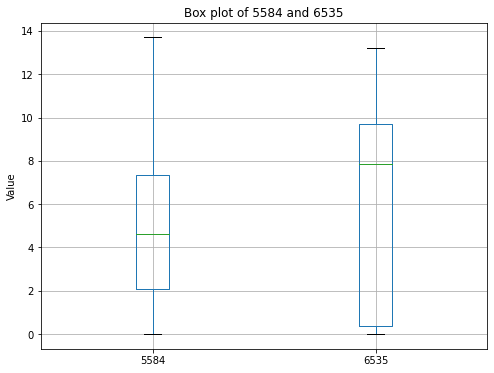

In [ ]:
# Select the two features you want to plot
feature1 = '5584'
feature2 = '6535'

# Create a box plot of the two features
plt.figure(figsize=(8,6))
df.boxplot(column=[feature1, feature2])
plt.title('Box plot of {} and {}'.format(feature1, feature2))
plt.ylabel('Value')
plt.show()

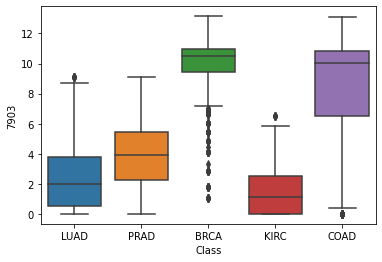

In [ ]:
sns.boxplot(x='Class', y='7903', data=df) # Boxplot of feature 7903
plt.show() # Showing the plot

As it is clearly visible Except the BRCA and COAD all the others are symmetrical (median line towards the center) which shows that for these two there is some skewing which we will have to take care of and the some outliers have been generated still in BRCA but as the IQR is small (spread of data) it shows little to no effect on these outliersand as there is no overlap between the boxes we can infer that the groups are very different from each other

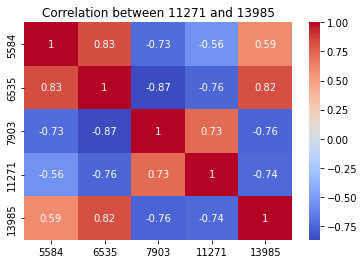

In [ ]:
corr_matrix = selected_features_df.corr() # Correlation matrix of the selected features

# Plot the heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation between 11271 and 13985')
plt.show()

This shows the correlation of the 5 most important features to each other from these we can infer that for example the value for "5584 gene" and "7903 gene" is almost -0.73 which tells how these two are almost inversely related that is for example if gene 5584 was an oncogene for KIRC the gene 7903 acts as an inhibitor for the same thus they work opposite to each other similarly for positive values we can infer that they are directly related 

/var/folders/4l/dxywwhyj7698c0wn31g0knjw0000gn/T/ipykernel_39183/150763711.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features['target'] = y


<Figure size 720x720 with 0 Axes>

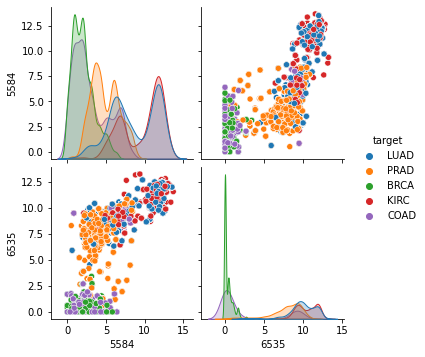

In [ ]:
plt.figure(figsize=(10,10)) # Setting the figure size
features = selected_features_df.iloc[:, :2] # Selecting the first two features
# Add the target variable to the features dataframe
features['target'] = y
# Create pairplots between the features
sns.pairplot(features, hue='target')
plt.show()

in this we can see 2 plots basically one is a scatter plot awhile the other is a density plot first we'll tend to the scatter plot which is on the bottom left and top right corners by observation we can see that the for 5584 and 6535 we can see that the BRCA and COAD data almost overlap while we can still draw boundaries on the rest of them similarly for KIRC and LUAD and this trend is also scene which indicates that the genes which are involved in predicting KIRC and LUAD hace high correlation which was also verified bt the plot above as well
Also we dont see any significant outlier per say as confirmed by the IQR in boxplot as well
Now on the other diagonal we have the density plot we determine the importance of each feature in distinguishing between the classes by examining the density plots . If a feature has a high density of data points for one or more classes, it suggests that the feature is important in distinguishing between those classes. For example we can see how relevant gene 6535 is for predicting BRCA because of that high density 

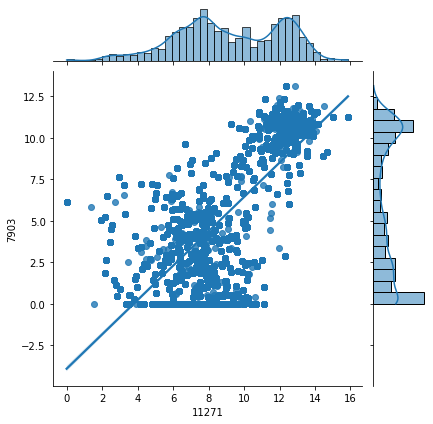

In [ ]:
# Join-Plot

sns.jointplot(x='11271',y='7903',data=df,kind='reg')

By looking at the scatter plot,we can get an idea of the general relationship between the two features. As the points are clustered tightly around the regression line, it suggests a strong linear relationship between the two features.

The slope of the regression line can provide additional information about the relationship between the features. As the slope is positive, it suggests that as the values of feature 11271 increase, so do the values of feature 7903.

On the the axis we can also see the distribution of the data for each of the features

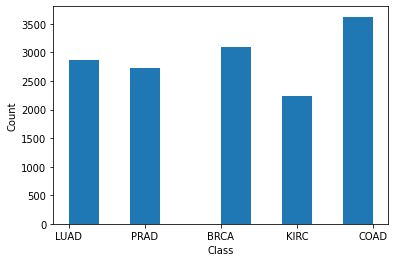

In [ ]:
# Histogram

plt.hist(df.iloc[:, -1])
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

Upon plotting the histogram for the count of all the data for each class we can see that there is a clear class imbalance so we will use oversampling to fix it

## Oversampling

In [ ]:
# Converting X and y to numpy ndarray

X = np.asarray(X)
y = np.asarray(y)

In [ ]:
# Count of each label
labels = {"LUAD":0,"PRAD":0,"BRCA":0,"KIRC":0,"COAD":0}
for i in range(len(y)):
    labels[str(y[i][0])] = labels[str(y[i][0])]+1

# max values in labels
data_based_labels = {"LUAD":[],"PRAD":[],"BRCA":[],"KIRC":[],"COAD":[]}
for i in range(len(y)):
    data_based_labels[y[i][0]].append(X[i])
mx = max(labels.values())
key = list(labels.keys())

In [ ]:
X = pd.DataFrame(X) # Converting X to dataframe
y = pd.DataFrame(y)     # Converting y to dataframe
z1 = pd.DataFrame(data_based_labels["LUAD"]) # Converting data_based_labels["LUAD"] to dataframe
z2 = pd.DataFrame(data_based_labels["PRAD"])    # Converting data_based_labels["PRAD"] to dataframe
z3 = pd.DataFrame(data_based_labels["BRCA"])   # Converting data_based_labels["BRCA"] to dataframe
z4 = pd.DataFrame(data_based_labels["KIRC"])  # Converting data_based_labels["KIRC"] to dataframe

In [ ]:
X = pd.concat([X,z1.iloc[:mx-labels["LUAD"]:],z2.iloc[:mx-labels["PRAD"]:],z3.iloc[:mx-labels["BRCA"]:],z4.iloc[:mx-labels["KIRC"]:]],axis=0)

In [ ]:
adding_labels = {"LUAD":[],"PRAD":[],"BRCA":[],"KIRC":[],"COAD":[]} # Dictionary to store the labels
for i in range(len(key)): # Looping through each key
    j= 0  # Initializing j to 0
    while(j<mx-labels[key[i]]): # Looping through each label
        adding_labels[key[i]].append(key[i]) # Appending the label to the dictionary
        j=j+1 # Incrementing j by 1

In [ ]:
y = pd.DataFrame(y) # Converting y to dataframe
z1 = pd.DataFrame(adding_labels["LUAD"]) # Converting adding_labels["LUAD"] to dataframe
z2 = pd.DataFrame(adding_labels["PRAD"])    # Converting adding_labels["PRAD"] to dataframe
z3 = pd.DataFrame(adding_labels["BRCA"])    # Converting adding_labels["BRCA"] to dataframe
z4 = pd.DataFrame(adding_labels["KIRC"]) # Converting adding_labels["KIRC"] to dataframe

In [ ]:
y = pd.concat([y,z1.iloc[:mx-labels["LUAD"]:],z2.iloc[:mx-labels["PRAD"]:],z3.iloc[:mx-labels["BRCA"]:],z4.iloc[:mx-labels["KIRC"]:]],axis=0) # Concatenating the dataframes

In [ ]:
# df = pd.DataFrame(X)
# df.to_csv("data_oversampled.csv",index = False)

In [ ]:
# df = pd.DataFrame(y)
# df.to_csv("labels_oversampled.csv",header=['Class'],index = False)

In [ ]:
X = pd.read_csv("/content/gdrive/MyDrive/dataset/data_oversampled.csv") # Loading the data
# with open('ReadData', 'wb') as f:
#      pickle.dump(X, f)
# with open('/kaggle/input/readdata/X', 'rb') as f:
#     X = pickle.load(f)
X

,0,1,2,3,4,5,6,7,8,9,...,15110,15111,15112,15113,15114,15115,15116,15117,15118,15119
0,0.0,0.592732,1.588421,7.586157,6.816049,0.000000,0.587845,2.466601,0.000000,11.055208,...,7.019935,9.190867,10.639259,4.593372,7.323865,6.256586,12.674552,10.517059,9.397854,2.094168
1,1.0,3.511759,4.327199,6.881787,6.972130,0.000000,0.452595,1.981122,1.683023,8.210248,...,7.524667,9.036654,10.336027,5.125213,8.127123,5.401607,9.045255,9.788359,10.090470,1.683023
2,2.0,3.663618,4.507649,6.659068,7.843375,0.000000,0.434882,2.874246,1.267356,8.306317,...,7.924997,8.665592,9.194823,6.076566,8.792959,8.942805,11.392682,9.694814,9.684365,3.292001
3,3.0,2.655741,2.821547,6.539454,6.566967,0.000000,1.275841,2.141204,0.889707,10.149150,...,7.364056,8.233366,9.298775,5.996032,8.891425,7.181162,11.922439,9.217749,9.461191,5.110372
4,4.0,3.467853,3.581918,6.620243,7.758510,0.515410,0.515410,2.516797,0.894294,6.842765,...,7.015482,8.344820,7.831035,5.726657,8.602588,6.096154,11.556995,9.244150,9.836473,5.355133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18120,8918.0,2.757237,2.416191,7.349162,6.073865,0.000000,1.547697,2.858279,0.000000,7.901096,...,6.949838,8.771740,8.980045,5.944659,9.222305,0.566474,12.766939,10.279193,9.354300,5.337447
18121,8928.0,3.487692,4.071145,8.695938,8.745140,0.000000,0.534759,2.950655,0.000000,8.342235,...,8.152787,9.955669,10.988024,4.707580,8.264368,0.000000,12.416890,10.176086,9.326966,3.713234
18122,8929.0,3.905851,2.956800,5.872117,9.640388,4.281498,1.343294,2.985100,9.150397,9.282692,...,7.138446,7.322902,7.841004,5.796323,7.791814,5.485829,11.767998,10.391287,9.384091,4.281498
18123,8937.0,4.662205,3.903356,7.586667,6.247067,0.000000,0.000000,2.816538,0.000000,7.620946,...,7.520037,9.590462,10.826572,3.954885,7.655960,0.000000,11.572861,10.050991,9.420516,2.441696


In [ ]:
y = pd.read_csv("/content/gdrive/MyDrive/dataset/labels_oversampled.csv") # loading oversampled labels datset
y

,Class
0,LUAD
1,PRAD
2,PRAD
3,BRCA
4,PRAD
...,...
18120,KIRC
18121,KIRC
18122,KIRC
18123,KIRC


In [ ]:
df = pd.concat([X,y],axis=1) # Concatenating X and y


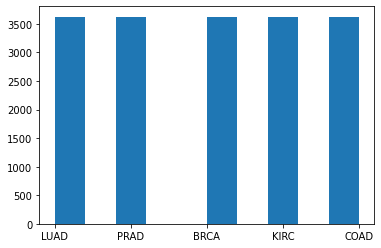

In [ ]:
# plotting histogram

plt.hist(df.iloc[:, -1])
plt.show()

Hence now we can see that the class imbalance has also been fixed

In [5]:
X = pd.read_csv("/content/gdrive/MyDrive/dataset/data_oversampled .csv") # Loading the data
y = pd.read_csv("/content/gdrive/MyDrive/dataset/labels_oversampled .csv") # loading oversampled labels datset

# Models

## Traditional Machine learning methods

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42) # Splitting the data into train and test

In [70]:
def train_split(): # Function to split the data into train and test
# Normalize the data
  scaler = StandardScaler() # Standardizing the data
  X_norm = scaler.fit_transform(X) # Fitting the data

  # Encode string labels as integers
  label_encoder = LabelEncoder() # Encoding the labels
  labels = label_encoder.fit_transform(y.values.ravel()) # Fitting the labels

  # Split into training and test sets
  X_train, X_test, y_train, y_test = train_test_split(X_norm, labels, test_size=0.2, random_state=42,stratify=y) # Splitting the data into train and test
  return X_train,X_test,y_train,y_test,label_encoder,labels # Returning the values

### Naive Bayes

In [9]:
clf_nb = GaussianNB() # Creating an instance of the model
# clf_nb.fit(X_train, y_train)
# with open('/content/gdrive/MyDrive/Model/NB', 'wb') as f:
#     pickle.dump(clf_nb, f)
with open('/content/gdrive/MyDrive/Model/NB', 'rb') as f: # Loading the model
    clf_nb = pickle.load(f)
predicted_y_nb = clf_nb.predict(X_test)    # Making predictions on the testing set
acc_nb = accuracy_score(y_test, predicted_y_nb)    # Evaluating the model using accuracy score
print("Accuracy of the Naive Bayes model is : {:.2f}%".format(acc_nb * 100)) # Printing the accuracy score
precision_nb = precision_score(y_test, predicted_y_nb, average='macro') # Evaluating the model using precision score
recall_nb = recall_score(y_test, predicted_y_nb, average='macro') # Evaluating the model using recall score
f1_nb = f1_score(y_test, predicted_y_nb, average='macro') # Evaluating the model using f1 score
print("Naive Bayes model Precision:", precision_nb) # Printing the precision score
print("Naive Bayes model Recall:", recall_nb) # Printing the recall score
print("Naive Bayes model F1 Score:", f1_nb) # Printing the f1 score

Accuracy of the Naive Bayes model is : 76.56%
Naive Bayes model Precision: 0.7465373407233872
Naive Bayes model Recall: 0.7345664376148406
Naive Bayes model F1 Score: 0.7374015429128719


### Applying Different Cross Validation

#### K-Fold Cross Validation

In [20]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)
kf = KFold(n_splits=7, shuffle=True)          #fitting model
cv_4_score = cross_val_score(clf_nb, X_std, y, cv=kf).mean()       #mean of cvscore of the fit
print("K Fold Cross Validation score: ",cv_4_score*100)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

K Fold Cross Validation score:  66.98689677213167


#### Stratified 3-fold Cross-Validation

In [21]:
skf = StratifiedKFold(n_splits=5, shuffle=True)
stratified_cv_3_score = cross_val_score(clf_nb, X_std, y, cv=skf).mean()
print("Stratified 3 Fold Cross Validation Score: ",stratified_cv_3_score*100)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

Stratified 3 Fold Cross Validation Score:  64.97607655502392


#### Monte Carlo Cross-Validation

In [22]:
ss = ShuffleSplit(n_splits=6, test_size=0.3)
mc_cv_score = cross_val_score(clf_nb, X_std, y, cv=ss).mean()
print("Monte Carlo Cross-Validation: ",mc_cv_score*100)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

Monte Carlo Cross-Validation:  64.64968152866241


### SVM

In [23]:
clf_svm = SVC(kernel = 'rbf')
# clf_svm.fit(X_train, y_train)
# with open('/content/gdrive/MyDrive/Model/SVM', 'wb') as f:
#     pickle.dump(clf_svm, f)
with open('/content/gdrive/MyDrive/Model/SVM', 'rb') as f:
    clf_svm = pickle.load(f)
predicted_y_svm = clf_svm.predict(X_test) # making prediction
acc_svm = accuracy_score(y_test, predicted_y_svm)
print("Accuracy of the SVM model is : {:.2f}%".format(acc_svm * 100))
precision_svm = precision_score(y_test, predicted_y_svm, average='macro')
recall_svm = recall_score(y_test, predicted_y_svm, average='macro')
f1_svm = f1_score(y_test, predicted_y_svm, average='macro')

# Evaluation
print("Precision of SVM Model:", precision_svm)
print("Recall of SVM Model:", recall_svm)
print("F1 Score of SVM Model:", f1_svm)

Accuracy of the SVM model is : 87.56%
Precision of SVM Model: 0.8822167622167623
Recall of SVM Model: 0.8478396448438168
F1 Score of SVM Model: 0.8586455233514056


### KNN

In [15]:
val = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]
score = []
for i in val:
  clf_knn = KNeighborsClassifier(n_neighbors=i)
  clf_knn.fit(X_train, y_train)
  predicted_y_knn = clf_knn.predict(X_test) # making prediction
  acc_knn = accuracy_score(y_test, predicted_y_knn)
  score.append(acc_knn)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

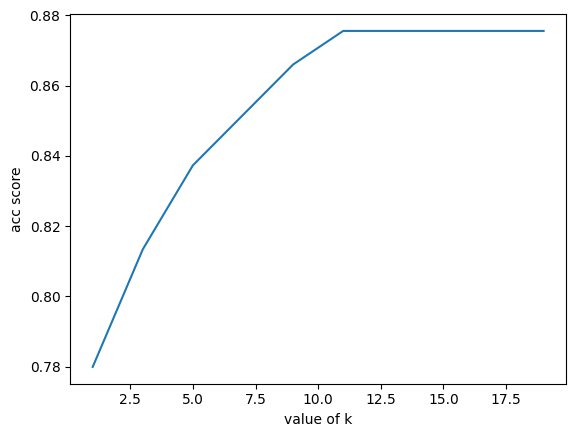

In [16]:
plt.plot(val,score)
plt.xlabel("value of k")
plt.ylabel("acc score")
plt.show()

<p>As we can see from above graph after k is 11 its accuracy doesn't change and hence k=11 is the optimum value for k.</p>

In [17]:
clf_knn = KNeighborsClassifier(n_neighbors=11)
# clf_knn.fit(X_train, y_train)
# with open('/content/gdrive/MyDrive/Model/KNN', 'wb') as f:
#     pickle.dump(clf_knn, f)
with open('/content/gdrive/MyDrive/Model/KNN', 'rb') as f:
    clf_knn = pickle.load(f)
predicted_y_knn = clf_knn.predict(X_test) # making prediction
acc_knn = accuracy_score(y_test, predicted_y_knn)
print("Accuracy of the KNN model is : {:.2f}%".format(acc_knn * 100)) # Printing the accuracy score
precision_knn = precision_score(y_test, predicted_y_knn, average='macro') # Evaluating the model using precision score
recall_knn = recall_score(y_test, predicted_y_knn, average='macro') # Evaluating the model using recall score
f1_knn = f1_score(y_test, predicted_y_knn, average='macro')

# Evaluation
print("KNN Model Precision:", precision_knn) 
print("KNN Model Recall:", recall_knn)
print("KNN Model F1 Score:", f1_knn)

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Accuracy of the KNN model is : 87.56%
KNN Model Precision: 0.8822167622167623
KNN Model Recall: 0.8478396448438168
KNN Model F1 Score: 0.8586455233514056


From all the traditional machine learning models we applied we noticed that the feature engineering and the data augmentation and analysis put into improve the dataset has let us keep the accuracy at almost around 80 now we will move onto Deep learning models 

## Deep Learning Models

### MLP

In [63]:
# Define the neural network model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42,stratify=y)
 # Adding the layers
model_mlp = MLPClassifier(hidden_layer_sizes=(128, 100), max_iter=1000)
# model_mlp.fit(X_train, y_train)

# with open('/content/gdrive/MyDrive/Model/MLP', 'wb') as f:
#      pickle.dump(model_mlp, f)
with open('/content/gdrive/MyDrive/Model/MLP', 'rb') as f:
    model_mlp = pickle.load(f)

# Predict on test set and calculate metrics
y_pred = model_mlp.predict(X_test)
acc_mlp = model_mlp.score(X_test, y_test)
print("Accuracy of MLP Model: {:.2f}%".format(acc_mlp*100)) # Printing the accuracy score

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1098: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy of MLP Model: 78.47%


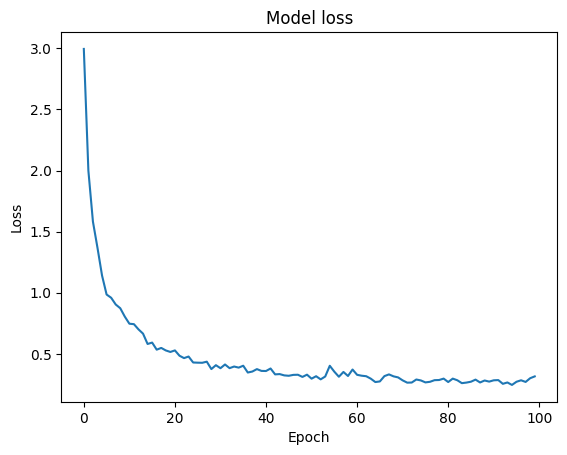

In [36]:
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

### Neural Network

In [35]:
#Define the neural network model

X_train,X_test,y_train,y_test,label_encoder,labels = train_split() # Calling the function
# Adding the layers
model_nn = keras.models.Sequential()
model_nn.add(keras.layers.Dense(128, input_dim=X_train.shape[1], activation='relu'))
model_nn.add(keras.layers.BatchNormalization()) 
model_nn.add(keras.layers.Dense(64, activation='relu'))
model_nn.add(keras.layers.Dropout(0.5))
model_nn.add(keras.layers.Dense(32, activation='relu'))
model_nn.add(keras.layers.Dropout(0.5))
model_nn.add(keras.layers.Dense(33, activation='softmax'))

# Compile the model with regularization
from keras import regularizers
model_nn.compile(loss='sparse_categorical_crossentropy', optimizer='adam')

# # Train the model
# history = model_nn.fit(X_train, y_train, epochs=100,batch_size=64,verbose=False)

# with open('/content/gdrive/MyDrive/Model/NN', 'wb') as f:
#     pickle.dump(model_nn, f)
with open('/content/gdrive/MyDrive/Model/NN', 'rb') as f:
    model_nn = pickle.load(f)

# Predict on test set and calculate metrics
y_pred = model_nn.predict(X_test)
y_pred = np.argmax(y_pred, axis=-1)
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
acc_nn = accuracy_score(y_test, y_pred)

print("Accuracy of The Neural Network Model: {:.2f}%".format(acc_nn*100)) # Printing the accuracy score

7/7 [==============================] - 0s 3ms/step
Accuracy of The Neural Network Model: 82.30%


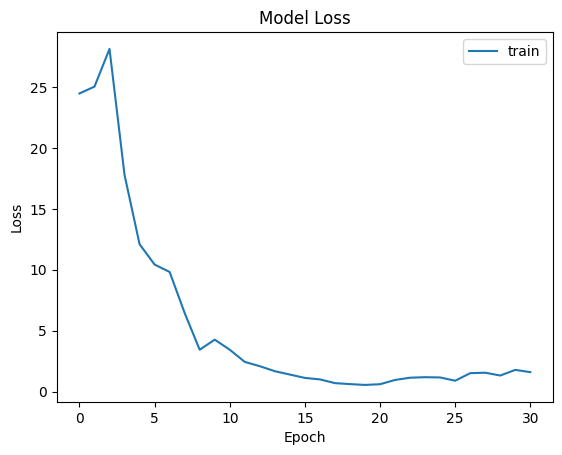

In [64]:
plt.plot(model_mlp.loss_curve_, label='train')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

### CNN

In [71]:
X_train,X_test,y_train,y_test,label_encoder,labels = train_split()

X_train_cnn = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test_cnn = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

# Build the CNN model and Adding the layers
model_cnn = keras.models.Sequential()
model_cnn.add(keras.layers.Conv1D(filters=128, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
model_cnn.add(keras.layers.BatchNormalization())
model_cnn.add(keras.layers.MaxPooling1D(pool_size=2))
model_cnn.add(keras.layers.Dropout(0.5))
model_cnn.add(keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu'))
model_cnn.add(keras.layers.BatchNormalization())
model_cnn.add(keras.layers.MaxPooling1D(pool_size=2))
model_cnn.add(keras.layers.Dropout(0.5))
model_cnn.add(keras.layers.Flatten())
model_cnn.add(keras.layers.Dense(32, activation='relu'))
model_cnn.add(keras.layers.Dense(5, activation='softmax'))

# Compile the model
model_cnn.compile(loss='sparse_categorical_crossentropy', optimizer='adam')

# Train the model
# model_cnn.fit(X_train, y_train, epochs=100, batch_size=64,verbose = False)

# with open('/content/gdrive/MyDrive/Model/CNN', 'wb') as f:
#      pickle.dump(model_cnn, f)
with open('/content/gdrive/MyDrive/Model/CNN', 'rb') as f:
    model_cnn = pickle.load(f)


y_pred = model_cnn.predict(X_test)
y_pred = np.argmax(y_pred, axis=-1)
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
acc_cnn = accuracy_score(y_test, y_pred)

print("CNN Model Accuracy: {:.2f}%".format(acc_cnn*100)) # Printing the accuracy score

7/7 [==============================] - 0s 44ms/step
CNN Model Accuracy: 91.87%


### GRU

In [80]:
X_train,X_test,y_train,y_test,label_encoder,labels = train_split()

timesteps = 1
input_dim = X_train.shape[1]
# Reshape data for GRU
X_train_gru = np.reshape(X_train, (X_train.shape[0], timesteps, input_dim))
X_test_gru = np.reshape(X_test, (X_test.shape[0], timesteps, input_dim))

# Define the GRU model
model_gru = Sequential()
model_gru.add(GRU(64, input_shape=(timesteps, input_dim), activation='relu', return_sequences=True))
model_gru.add(Dropout(0.5))
model_gru.add(GRU(32, activation='relu'))
model_gru.add(Dropout(0.5))
model_gru.add(Dense(len(np.unique(labels)), activation='softmax'))

# Compile the GRU model
model_gru.compile(loss='sparse_categorical_crossentropy', optimizer='adam')

# Train the GRU model
# history = model_gru.fit(X_train_gru, y_train, epochs=100, batch_size=64,verbose=False)

# with open('/content/gdrive/MyDrive/Model/GRU', 'wb') as f:
#      pickle.dump(model_gru, f)
# with open('/content/gdrive/MyDrive/Model/GRU2', 'wb') as f:
#      pickle.dump(history, f)
with open('/content/gdrive/MyDrive/Model/GRU', 'rb') as f:
     model_gru = pickle.load(f)
with open('/content/gdrive/MyDrive/Model/GRU2', 'rb') as f:
     history = pickle.load(f)


# Predict on test set and calculate metrics for GRU
y_pred_gru = model_gru.predict(X_test_gru)
y_pred_gru = np.argmax(y_pred_gru, axis=-1)
y_pred_gru = label_encoder.inverse_transform(y_pred_gru)
y_test_gru = label_encoder.inverse_transform(y_test)
acc_gru = accuracy_score(y_test_gru, y_pred_gru)
print("GRU Model Accuracy: {:.2f}%".format(acc_gru*100))

7/7 [==============================] - 0s 6ms/step
GRU Model Accuracy: 87.08%


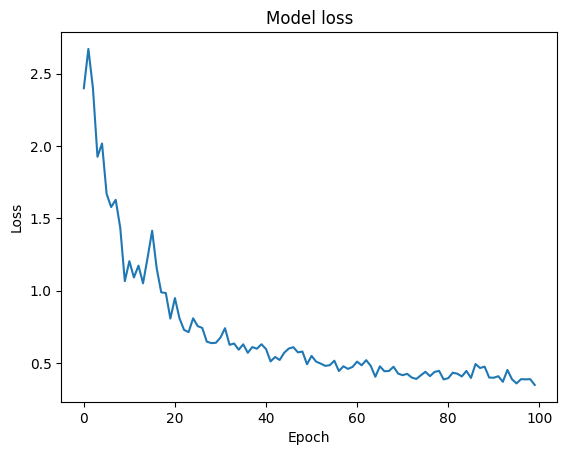

In [81]:
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

### RNN

In [84]:
X_train,X_test,y_train,y_test,label_encoder,labels = train_split()

timesteps = 1
input_dim = X_train.shape[1]
X_train_rnn = np.reshape(X_train, (X_train.shape[0], timesteps, input_dim))
X_test_rnn = np.reshape(X_test, (X_test.shape[0], timesteps, input_dim))

# Define the RNN model
model_rnn = Sequential()
model_rnn.add(SimpleRNN(64, input_shape=(timesteps, input_dim), activation='relu', return_sequences=True))
model_rnn.add(Dropout(0.5))
model_rnn.add(SimpleRNN(32, activation='relu'))
model_rnn.add(Dropout(0.5))
model_rnn.add(Dense(len(np.unique(labels)), activation='softmax'))

# Compile the model
model_rnn.compile(loss='sparse_categorical_crossentropy', optimizer='adam')

# Train the model
# history =  model_rnn.fit(X_train_rnn, y_train, epochs=100, batch_size=64,verbose=False)

# with open('/content/gdrive/MyDrive/Model/RNN', 'wb') as f:
#      pickle.dump(model_rnn, f)
# with open('/content/gdrive/MyDrive/Model/RNN2', 'wb') as f:
#      pickle.dump(history, f)
with open('/content/gdrive/MyDrive/Model/RNN', 'rb') as f:
    model_rnn = pickle.load(f)
with open('/content/gdrive/MyDrive/Model/RNN2', 'rb') as f:
     history = pickle.load(f)

# Predict on test set and calculate metrics
y_pred = model_rnn.predict(X_test_rnn)
y_pred = np.argmax(y_pred, axis=-1)
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
acc_rnn = accuracy_score(y_test, y_pred)

print("Accuracy of the RNN Model: {:.2f}%".format(acc_rnn*100))

7/7 [==============================] - 0s 3ms/step
Accuracy of the RNN Model: 90.43%


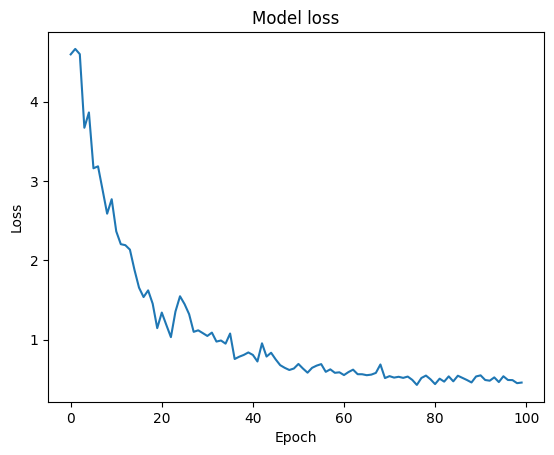

In [85]:
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

### LSTM

In [88]:
X_train,X_test,y_train,y_test,label_encoder,labels = train_split()

timesteps = 1
input_dim = X_train.shape[1]
X_train_lstm = np.reshape(X_train, (X_train.shape[0], timesteps, input_dim))
X_test_lstm = np.reshape(X_test, (X_test.shape[0], timesteps, input_dim))

# Define the LSTM model
model_lstm = Sequential()
model_lstm.add(LSTM(64, input_shape=(timesteps, input_dim), activation='relu', return_sequences=True))
model_lstm.add(Dropout(0.5))
model_lstm.add(LSTM(32, activation='relu'))
model_lstm.add(Dropout(0.5))
model_lstm.add(Dense(len(np.unique(labels)), activation='softmax'))

# Compile the LSTM model
model_lstm.compile(loss='sparse_categorical_crossentropy', optimizer='adam')

# Train the LSTM model
# history = model_lstm.fit(X_train_rnn, y_train, epochs=100, batch_size=64,verbose = False)

# with open('/content/gdrive/MyDrive/Model/LSTM', 'wb') as f:
#      pickle.dump(model_lstm, f)
# with open('/content/gdrive/MyDrive/Model/LSTM2', 'wb') as f:
#      pickle.dump(history, f)
with open('/content/gdrive/MyDrive/Model/LSTM', 'rb') as f:
    model_lstm = pickle.load(f)
with open('/content/gdrive/MyDrive/Model/LSTM2', 'rb') as f:
     history = pickle.load(f)


# Predict on test set and calculate metrics for LSTM
y_pred_lstm = model_lstm.predict(X_test_lstm)
y_pred_lstm = np.argmax(y_pred_lstm, axis=-1)
y_pred_lstm = label_encoder.inverse_transform(y_pred_lstm)
y_test_lstm = label_encoder.inverse_transform(y_test)
acc_lstm = accuracy_score(y_test_lstm, y_pred_lstm)
print("LSTM Model Accuracy: {:.2f}%".format(acc_lstm*100))



7/7 [==============================] - 0s 4ms/step
LSTM Model Accuracy: 89.00%


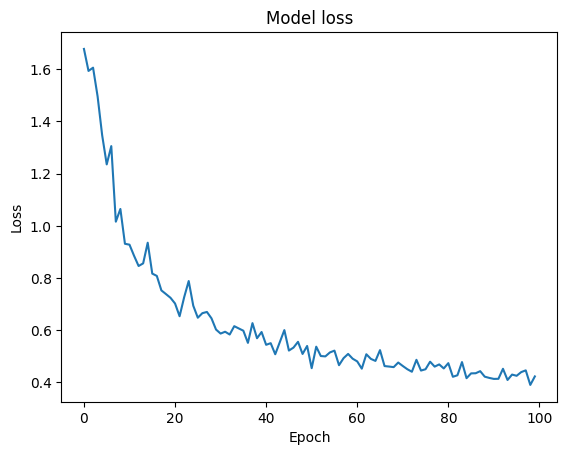

In [89]:
plt.plot(history.history['loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

After applying all the above models we have reached a combined total of the below shown accuracies
Sequential Neural Network: 82.3%
MLP architecture: 78.43%
CNN: 91.87%
GRU: 87.08%
RNN: 90.43%
LSTM: 89.00%
While training all the models we have tuned the hyper parameters manually as well as used batch normalization and dropout regularization wherever possible to increase the accuracy 

# Tree Models

### Decision Tree

In [31]:
# Changing dataframe in numpy ndarray format

X = np.asarray(X)
y = np.asarray(y)

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state = 42,stratify=y)

In [32]:
dt = DecisionTreeClassifier(max_depth=5) # creating the model with max depth 5
dt_bagging_model = BaggingClassifier(base_estimator=dt) # creating the model
# dt_bagging_model.fit(X_train,y_train) # fitting thr model on the training data

# with open('/content/gdrive/MyDrive/Model/DT', 'wb') as f:
#      pickle.dump(dt_bagging_model, f)
with open('/content/gdrive/MyDrive/Model/DT', 'rb') as f:
    dt_bagging_model = pickle.load(f)

y_pred = dt_bagging_model.predict(X_test)# predicting the model result on test data
count = 0  # calculating accuracy of the model
for i in range(0,len(y_pred)):
    if(y_pred[i]==y_test[i]):
        count+=1
print("Accuracy of the Descision Tree classifier with Bootstarp Aggreagation is : ",(count/len(y_pred))*100) # printing the accuracy


Accuracy of the Descision Tree classifier with Bootstarp Aggreagation is :  90.9090909090909


### AdaBoosting

In [33]:
adaboost_model = AdaBoostClassifier(base_estimator=dt)  # creating the model
# adaboost_model.fit(X_train,y_train)

# with open('/content/gdrive/MyDrive/Model/AB', 'wb') as f:
#      pickle.dump(adaboost_model, f)
with open('/content/gdrive/MyDrive/Model/AB', 'rb') as f:
     adaboost_model = pickle.load(f)

y_pred = adaboost_model.predict(X_test) # predicting the test data

count = 0 # calculating accuracy of the model
for i in range(0,len(y_pred)):
    if(y_pred[i]==y_test[i]):
        count+=1
print("Accuracy of the Descision Tree classifier with Adaboost is : ",(count/len(y_pred))*100) # printing the accuracy

Accuracy of the Descision Tree classifier with Adaboost is :  92.82296650717703


### Random Forest

In [35]:
random_forest_model = RandomForestClassifier(max_depth = 5) # making the random forest classifier
# random_forest_model.fit(X_train,y_train) # fitting thr model on the training data

# with open('/content/gdrive/MyDrive/Model/RT', 'wb') as f:
#      pickle.dump(random_forest_model, f)
with open('/content/gdrive/MyDrive/Model/RT', 'rb') as f:
     random_forest_model = pickle.load(f)

y_pred = random_forest_model.predict(X_test)

count = 0 # calculating accuracy of the model
for i in range(0,len(y_pred)):
    if(y_pred[i]==y_test[i]):
        count+=1
print("Accuracy of the rabdom forest classifier is : ",(count/len(y_pred))*100)

Accuracy of the rabdom forest classifier is :  92.34449760765551


### Grid Search With Ensemble Method

In [36]:
pipe = Pipeline([
    ('scaler', StandardScaler()),  # Preprocessing step
    ('classifier', 'passthrough')  # Model step
])

# Define the parameter grid for each classifier
param_grid = [
    {
        'classifier': [LogisticRegression(random_state=42)],
        'classifier__C': [0.01, 0.1, 1, 10, 100]
    },
    {
        'classifier': [DecisionTreeClassifier(random_state=42)],
        'classifier__max_depth': [2, 4, 6, 8, 10]
    },
    {
        'classifier': [KNeighborsClassifier()],
        'classifier__n_neighbors': [3, 5, 7, 9, 11]
    },
    {
        'classifier': [SVC(random_state=42)],
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__kernel': ['linear', 'rbf']
    }
]

# Create a GridSearchCV object with the pipeline and parameter grid
grid = GridSearchCV(pipe, param_grid, cv=5,scoring='accuracy')

# Fit the GridSearchCV object to the training data
# grid.fit(X_train, y_train)

# with open('/content/gdrive/MyDrive/Model/PG', 'wb') as f:
#      pickle.dump(grid, f)
with open('/content/gdrive/MyDrive/Model/PG', 'rb') as f:
     grid = pickle.load(f)

y_pred = grid.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy of the best model
print("Accuracy of Ensemble Model With Grid Search:", accuracy*100)

Accuracy of Ensemble Model With Grid Search: 91.38755980861244


In [ ]:
y_test_ = pd.read_csv("/content/gdrive/MyDrive/dataset/y_test.csv")
y_pred_ = pd.read_csv("/content/gdrive/MyDrive/dataset/y_pred.csv")
y_test_ = y_test_.drop("Unnamed: 0", axis=1) # dropping last column containing unnecesary string values

# Post-0hoc Interpretability Analysis

### LSTM

#### Confusion Matrix

<Axes: >

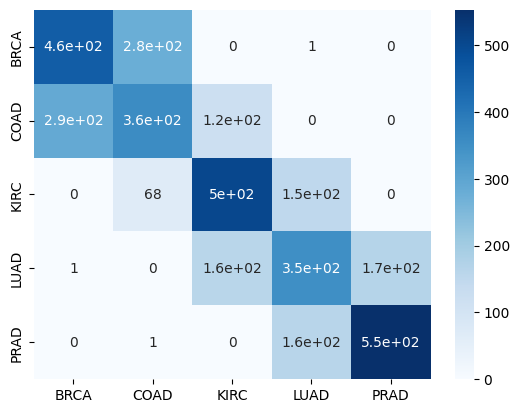

In [ ]:
# Splitting Dataset
X_train,X_test,y_train,y_test,label_encoder,labels = train_split()
cm = confusion_matrix(y_test_, y_pred_, labels=label_encoder.classes_)

# Plotting Heatmap
sns.heatmap(cm, annot=True, cmap='Blues', xticklabels=np.unique(y), yticklabels=np.unique(y))

<p>From the above heatmap we can infere that which cancer has been predicted wrong and what it was predicted with the count. </p>

#### LIME

In [ ]:
df = pd.concat([X,y],axis=1) # merging X and y in one dataframe

<p>So Lime is a method to find the weights corresponding to each feature for the prediction. The negative weight for a feature depict that how non useful the feature was for the prediction and more postive weight tells how much it is needed for the result prediction.</p>

In [ ]:
# Create instance of a RecurrentTabularExplainer object

explainer = lime_tabular.RecurrentTabularExplainer(X_train_lstm, training_labels=y_train, feature_names=X.columns,
                                                   discretize_continuous=True,
                                                   class_names=['PRAD', 'BRCA','LUAD','COAD','KIRC'],
                                                   discretizer='decile')

In [ ]:
# explanation for a single instance of the test data X_test_lstm[0] for PRAD

exp = explainer.explain_instance(X_test_lstm[0], model_lstm.predict, num_features=10, labels=(0,))
exp.show_in_notebook()

157/157 [==============================] - 2s 13ms/step


<p>Here firstly we have done for  Prostate Adenocarcinoma  here we can see the most required gene is 1793 so we can infere that it may be (ERG) and the most negative weight gene is 13835 may be it is (BRCA1)</p>

In [ ]:
# explanation for a single instance of the test data X_test_lstm[0] for  BRCA

exp = explainer.explain_instance(X_test_lstm[0], model_lstm.predict, num_features=10, labels=(1,))
exp.show_in_notebook()

157/157 [==============================] - 3s 21ms/step


<p>Here we have done for Breast Cancer here we can see the most required gene is 11656 so we can infere that it may be (ErbB2, MYC, PIK3CA) gene and the most negative weight gene is 11133 and this can be one of these gene (TP53, BRCA1/2, RB1, PTEN) </p>

In [ ]:
# explanation for a single instance of the test data X_test_lstm[0] for LUAD

exp = explainer.explain_instance(X_test_lstm[0], model_lstm.predict, num_features=10, labels=(2,))
exp.show_in_notebook()

157/157 [==============================] - 2s 13ms/step


<p>Here we have done for  Lung Adenocarcinoma here we can see that most required gene is 14316 so we can infere from that it may be (KRAS) gene and the most negative weight gene is 16310 and this can be these gene(PTEN).</p>

In [ ]:
# explanation for a single instance of the test data X_test_lstm[0] for COAD

exp = explainer.explain_instance(X_test_lstm[0], model_lstm.predict, num_features=10, labels=(3,))
exp.show_in_notebook()

157/157 [==============================] - 2s 14ms/step


<p>Here we have done for  Colon Adenocarcinoma here we can see that most required gene is 3308 so we can infere from that it may be (PIK3CA) gene and the most negative weight gene is 5865 and this can be these gene(TP 53 ).</p>

In [ ]:
# explanation for a single instance of the test data X_test_lstm[0] for KIRC

exp = explainer.explain_instance(X_test_lstm[0], model_lstm.predict, num_features=10, labels=(4,))
exp.show_in_notebook()

157/157 [==============================] - 2s 13ms/step


<p>Here we have done for  Kidney Renal Clear Cell Carcinoma here we can see that most required gene is 5706 so we can infere from that it may be (HLRCC) gene and the most negative weight gene is 5221 and this can be these gene(inhibitor_VHL).</p>

#### Feature Ranking

In [ ]:
# Splitting the dataset
X_train,X_test,y_train,y_test,label_encoder,labels = train_split()
X_test = pd.DataFrame(X_test)
y_pred_lstm = pd.DataFrame(y_pred_lstm)

best_features = {}
# loop over the categories
for category in y_pred_lstm[0].unique():
    # select the rows for the current category
    mask = y_pred_lstm[0] == category
    X_a = X_test.loc[mask]
    y_a = y_pred_lstm[mask]
    
    # select the best features using f_classif
    selector = SelectKBest(f_classif, k=1)
    selector.fit(X_a, y_a)

    # get the boolean mask of the selected feature
    mask = selector.get_support()

    # get the name of the selected feature
    best_feature = X.columns[mask][0]
    
    # store the best feature for the current category
    best_features[category] = best_feature

# print the best features for each category
for category, feature in best_features.items():
    print(f"Best feature for category {category}: {feature}")

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
invalid value encountered in true_divide
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
invalid value encountered in true_divide
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
invalid value encountered in true_divide
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
invalid value encountered in true_divide


Best feature for category PRAD: 20530
Best feature for category BRCA: 20530
Best feature for category LUAD: 20530
Best feature for category COAD: 20530
Best feature for category KIRC: 20530


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
invalid value encountered in true_divide


In [ ]:
# Printing category wise best features
for category, feature in best_features.items():
    print(f"Best feature for category {category}: {feature}")

Best feature for category PRAD: 20530
Best feature for category BRCA: 20530
Best feature for category LUAD: 20530
Best feature for category COAD: 20530
Best feature for category KIRC: 20530


<p> The above result describe that gene_20530 presence ensure that the paitient is suffering from any of the above 5 type of cancer and from this we can infere the name of the gene that is P53</p>